<a href="https://colab.research.google.com/github/REHAB199/Saudi-Arabia-Weather-Deep-learning/blob/main/Code/Makkah_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 ## Import the libraries

 ---

In [1]:
# pandas
import pandas as pd
from pandas import datetime, DataFrame, Series, concat, read_csv
from pandas.core.window.rolling import Rolling

# numpy
import numpy as np
from numpy import array

# visualization
import seaborn as sns
from matplotlib import pyplot
import matplotlib.pyplot as plt
# %matplotlib inline
# %config InlineBackend.figure_format = 'svg'
from pylab import rcParams

# import chart_studio.plotly as py
import cufflinks as cf
import plotly.express as px

# warnings
import warnings
warnings.filterwarnings('ignore')

# sklearn 
import sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split as split

# math
from math import sqrt

# calendar
import calendar

# tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense, Dropout, Bidirectional, LSTM, Flatten, RepeatVector, TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

# scipy
import scipy
from scipy import stats 
from scipy.stats import kurtosis

# statsmodels
from statsmodels.tsa.seasonal import seasonal_decompose as sd
from statsmodels.graphics.gofplots import qqplot as qq
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  This is separate from the ipykernel package so we can avoid doing imports until


## Prepare Data
---

In [2]:
# date-time parsing function for loading the dataset
def parser(x):
	return datetime.strptime('190'+x, '%Y-%m')

In [3]:
# convert time series into supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

## Baseline Model
---

In [8]:
df = pd.read_csv('/content/mkhdata.csv')
df.drop(['Unnamed: 0'], axis =1 , inplace =True)
df2 = df[['date', 'temp']].set_index('date') #Create subset Dataframe with temperature and Date time, and reset the index
#Create Lags 1 and 24

lags = [1,24] 
df2 = df2.assign(**{
    f'{col} (t-{lag})': df2[col].shift(lag)
    for lag in lags
    for col in df2
})
#Split into training and test
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
df2_train, df2_test = train_test_split(df2, test_size=0.2, random_state= 30 , shuffle = False)

rmse_lag_1 = mean_squared_error(df2_test['temp'],df2_test['temp (t-1)'], squared=False)
rmse_lag_24 = mean_squared_error(df2_test['temp'],df2_test['temp (t-24)'], squared=False)

In [9]:
rmse_lag_1

1.0071280243468381

In [10]:
rmse_lag_24

2.215565868221529

## Split & load data

---

In [4]:
# transform series into train and test sets for supervised learning
def prepare_data(series, n_test, n_lag, n_seq):
	# extract raw values
	raw_values = series.values
	raw_values = raw_values.reshape(len(raw_values), 1)
	# rescale values to -1, 1
	scaler = MinMaxScaler(feature_range=(-1, 1))
	scaled_values = scaler.fit_transform(raw_values)
	scaled_values = scaled_values.reshape(len(scaled_values), 1)
	# transform into supervised learning problem X, y
	supervised = series_to_supervised(scaled_values, n_lag, n_seq)
	supervised_values = supervised.values
	# split into train and test sets
	train, test = supervised_values[0:-n_test], supervised_values[-n_test:]
	return scaler, train, test

In [5]:
# load dataset
df = pd.read_csv('/content/mkhdata.csv')
df.drop(['Unnamed: 0'], axis =1 , inplace =True)
series = df['temp']
# configure
n_lag = 24 #Look at 24 steps back to predict the future
n_seq = 1 #Predict the Future for one period ahead 
n_test = round(0.2*series.shape[0])
n_epochs = 20
n_batch = 1
#n_neurons = 1
# prepare data
scaler, train, test = prepare_data(series, n_test, n_lag, n_seq)

## Forecast & Evaluate Functions

---

In [71]:
# make one forecast with an LSTM,
def forecast_lstm(model, X, n_batch):
	# reshape input pattern to [samples, timesteps, features]
	X = X.reshape(1, 1, len(X))
	# make forecast
	forecast = model.predict(X, batch_size=n_batch)
	# convert to array
	return [x for x in forecast[0, :]]

In [72]:
# evaluate the persistence model
def make_forecasts(model, n_batch, train, test, n_lag, n_seq):
	forecasts = list()
	for i in range(len(test)):
		X, y = test[i, 0:n_lag], test[i, n_lag:]
		# make forecast
		forecast = forecast_lstm(model, X, n_batch)
		# store the forecast
		forecasts.append(forecast)
	return forecasts

In [73]:
# evaluate the RMSE for each forecast time step
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
	for i in range(n_seq):
		actual = [row[i] for row in test]
		predicted = [forecast[i] for forecast in forecasts]
		rmse = sqrt(mean_squared_error(actual, predicted))
		print('t+%d RMSE: %f' % ((i+1), rmse))

In [74]:
# plot the forecasts in the context of the original dataset
def plot_forecasts(series, forecasts, n_test):
	# plot the entire dataset in blue
	pyplot.plot(series.values)
	# plot the forecasts in red
	for i in range(len(forecasts)):
		off_s = len(series) - n_test + i - 1
		off_e = off_s + len(forecasts[i]) + 1
		xaxis = [x for x in range(off_s, off_e)]
		yaxis = [series.values[off_s]] + forecasts[i]
		pyplot.plot(xaxis, yaxis, color='red')
	# show the plot
	pyplot.show()

## LSTM Models
---

In [43]:
# fit an LSTM network to training data with 20 neurons
def fit_lstm_1(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=20):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

In [38]:
# fit an LSTM network to training data with 50 neurons
def fit_lstm_2(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=50):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

In [63]:
# fit an LSTM network to training data with 10 neurons
def fit_lstm_3(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=10):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

In [64]:
# fit an LSTM network to training data with 24 neurons
def fit_lstm_4(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=24):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

---

In [129]:
# fit model
model_1 = fit_lstm_1(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_1, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.126512


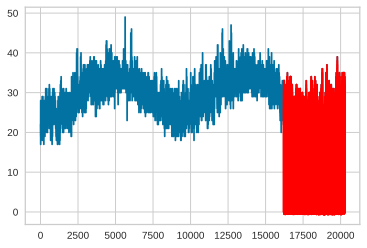

In [51]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [ ]:
#Check a model summary
model_1.summary()

---

In [52]:
# fit model
model_2 = fit_lstm_2(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_2, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.150887


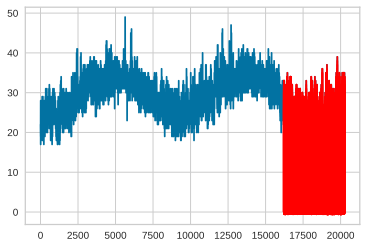

In [53]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [ ]:
#Check a model summary
model_2.summary()

---

In [78]:
# fit model
model_6 = fit_lstm_3(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_6, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.122265
t+1 RMSE: 0.121225


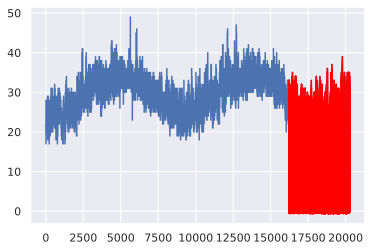

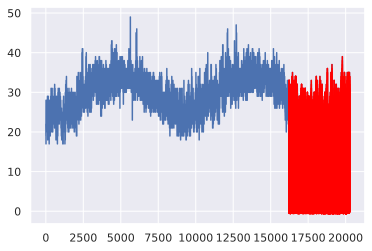

In [79]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [80]:
#Check a model summary
model_6.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (1, 10)                   1400      
                                                                 
 dense_2 (Dense)             (1, 1)                    11        
                                                                 
Total params: 1,411
Trainable params: 1,411
Non-trainable params: 0
_________________________________________________________________


---

In [82]:
# fit model
model_7 = fit_lstm_4(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_7, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.137903


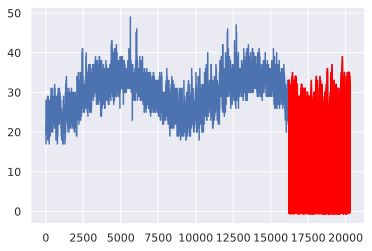

In [83]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [84]:
#Check a model summary
model_7.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (1, 24)                   4704      
                                                                 
 dense_3 (Dense)             (1, 1)                    25        
                                                                 
Total params: 4,729
Trainable params: 4,729
Non-trainable params: 0
_________________________________________________________________


## LSTM Stacked Small & Big

---

In [62]:
# SMALL

# fit an LSTM network to training data
def fit_lstm_stacked_small(train, n_lag, n_seq, n_batch, nb_epoch):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(LSTM(50, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True,activation='relu',return_sequences=True))
  #second LSTM layer 
	model.add(LSTM(50,activation='relu',return_sequences=True))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

In [125]:
# fit model
model_3 = fit_lstm_stacked_small(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_3, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.210538


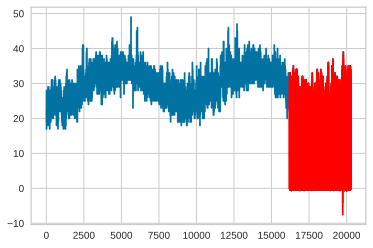

In [126]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [ ]:
#Check a model summary
model_3.summary()

---

In [100]:
# BIG

# fit an LSTM network to training data
def fit_lstm_stacked_big(train, n_lag, n_seq, n_batch, nb_epoch):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(LSTM(150, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True,return_sequences=True))
	model.add(Dropout(0.2)) # Dropout regularisation
  #second LSTM layer 
	model.add(LSTM(150,return_sequences=True))
  #Adding third LSTM layer 
	model.add(LSTM(150, return_sequences=True))
	model.add(Dropout(0.2))
  #Adding fourth LSTM layer
	model.add(LSTM(150))
	model.add(Dropout(0.2))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

In [114]:
# fit model
model_4 = fit_lstm_stacked_big(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_4, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.116172


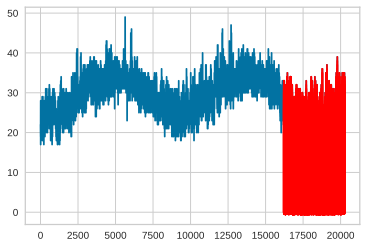

In [115]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [ ]:
#Check a model summary
model_4.summary()

## Bi-directional LSTM

---

In [54]:
def fit_lstm_bi_1(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=20):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(Bidirectional(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True)))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

In [65]:
# fit an LSTM network to training data
def fit_lstm_bi_stacked_small(train, n_lag, n_seq, n_batch, nb_epoch):
	# reshape training into [samples, timesteps, features]
	X, y = train[:, 0:n_lag], train[:, n_lag:]
	X = X.reshape(X.shape[0], 1, X.shape[1])
	# design network
	model = Sequential()
	model.add(Bidirectional(LSTM(50, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True,activation='relu',return_sequences=True)))
  #second LSTM layer 
	model.add(LSTM(50,activation='relu',return_sequences=True))
	model.add(Dense(y.shape[1]))
	model.compile(loss='mean_squared_error', optimizer='adam')
	# fit network
	for i in range(nb_epoch):
		model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
		model.reset_states()
	return model

---

In [55]:
# fit model
model_5 = fit_lstm_bi_1(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_5, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.126762


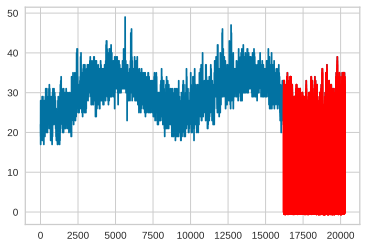

In [56]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [ ]:
#Check a model summary
model_5.summary()

---

In [85]:
# fit model
model_8 = fit_lstm_bi_stacked_small(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_8, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.155769


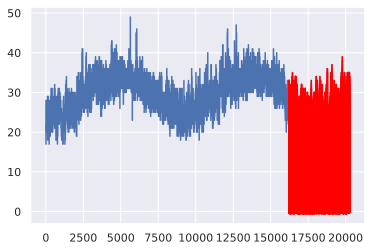

In [86]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [87]:
#Check a model summary
model_8.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (1, 1, 100)              30000     
 l)                                                              
                                                                 
 lstm_5 (LSTM)               (1, 1, 50)                30200     
                                                                 
 dense_4 (Dense)             (1, 1, 1)                 51        
                                                                 
Total params: 60,251
Trainable params: 60,251
Non-trainable params: 0
_________________________________________________________________


## LSTM Encoder-Decoder
---

Now, we will experiment with an LSTM Encoder-Decoder. This means that the model will not output a vector sequence directly. Instead, the model will be comprised of two sub models, the encoder to read and encode the input sequence, and the decoder that will read the encoded input sequence and make a one-step prediction for each element in the output sequence.
The difference is subtle, as in practice both approaches do in fact predict a sequence output.
The important difference is that an LSTM model is used in the decoder, allowing it to both know what was predicted for the prior day in the sequence and accumulate internal state while outputting the sequence.

In [88]:
# fit an LSTM Encoder-Decoder network to training data with 50 neurons
def fit_lstm_encoder_decoder(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=50):
    # reshape training into [samples, timesteps, features]
    X, y = train[:, 0:n_lag], train[:, n_lag:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    # design network
    model = Sequential()
    model.add(LSTM(n_neurons, activation='relu',batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(RepeatVector(y.shape[1]))
    model.add(LSTM(n_neurons, activation='relu', return_sequences=True))
    model.add(TimeDistributed(Dense(100, activation='relu')))
    model.add(TimeDistributed(Dense(y.shape[1])))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    for i in range(nb_epoch):
      model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
      model.reset_states()
    return model

---

In [90]:
model_9 = fit_lstm_encoder_decoder(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_9, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.129345


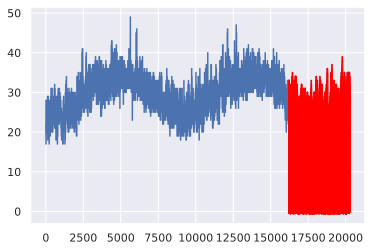

In [91]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [92]:
model_9.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (1, 50)                   15000     
                                                                 
 repeat_vector (RepeatVector  (1, 1, 50)               0         
 )                                                               
                                                                 
 lstm_7 (LSTM)               (1, 1, 50)                20200     
                                                                 
 time_distributed (TimeDistr  (1, 1, 100)              5100      
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (1, 1, 1)                101       
 tributed)                                                       
                                                      

---

In [93]:
# fit an LSTM Encoder-Decoder network to training data with 20 neurons
def fit_lstm_encoder_decoder(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons=20):
    # reshape training into [samples, timesteps, features]
    X, y = train[:, 0:n_lag], train[:, n_lag:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    # design network
    model = Sequential()
    model.add(LSTM(n_neurons, activation='relu',batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(RepeatVector(y.shape[1]))
    model.add(LSTM(n_neurons, activation='relu', return_sequences=True))
    model.add(TimeDistributed(Dense(100, activation='relu')))
    model.add(TimeDistributed(Dense(y.shape[1])))
    model.compile(loss='mean_squared_error', optimizer='adam')
    # fit network
    for i in range(nb_epoch):
      model.fit(X, y, epochs=1, batch_size=n_batch, verbose=0, shuffle=False)
      model.reset_states()
    return model

In [94]:
model_10 = fit_lstm_encoder_decoder(train, n_lag, n_seq, n_batch, n_epochs)
# make forecasts
forecasts = make_forecasts(model_10, n_batch, train, test, n_lag, n_seq)
# inverse transform forecasts and test
actual = [row[n_lag:] for row in test]
# evaluate forecasts
evaluate_forecasts(actual, forecasts, n_lag, n_seq)

t+1 RMSE: 0.128752


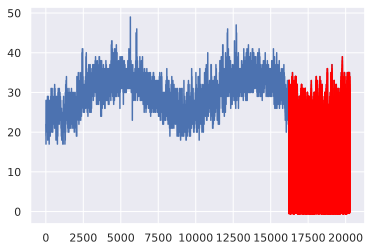

In [95]:
# plot forecasts
plot_forecasts(series, forecasts, n_test+2)

In [96]:
model_10.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (1, 20)                   3600      
                                                                 
 repeat_vector_1 (RepeatVect  (1, 1, 20)               0         
 or)                                                             
                                                                 
 lstm_9 (LSTM)               (1, 1, 20)                3280      
                                                                 
 time_distributed_2 (TimeDis  (1, 1, 100)              2100      
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (1, 1, 1)                101       
 tributed)                                                       
                                                      

## Conclusion
---

In [97]:
# create dataframe of rmses to comparing
data = {'Models': ['model_1', 'model_2', 'model_3', 'model_4', 'model_5',
                   'model_6', 'model_7', 'model_8', 'model_9', 'model_10'], 
         'RMSE': [0.126512 , 0.150887 , 0.210538 , 0.116172 , 0.126762 ,
                  0.122265 , 0.137903 , 0.155769 , 0.129345 , 0.128752]}
RMSEs = pd.DataFrame(data)
RMSEs

,Models,RMSE
0,model_1,0.126512
1,model_2,0.150887
2,model_3,0.210538
3,model_4,0.116172
4,model_5,0.126762
5,model_6,0.122265
6,model_7,0.137903
7,model_8,0.155769
8,model_9,0.129345
9,model_10,0.128752


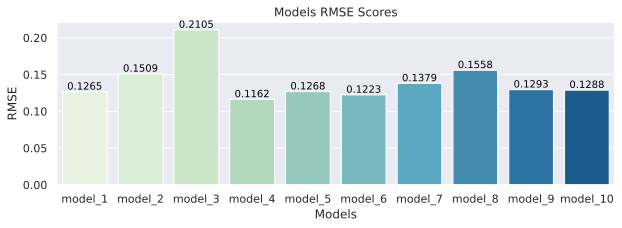

In [123]:
plt.figure(figsize=(10, 3))
plt.title('Models RMSE Scores')
chart = sns.barplot(x='Models', y='RMSE', data=RMSEs, palette= 'GnBu')
for p in chart.patches:
             chart.annotate("%0.4f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')
# plt.savefig('plot1.png', dpi=300, bbox_inches='tight');

From above we can say that the best model is **model_4,**

***the big stacked LSTM***. with the lowest *RMSE* (**0.116172**).

---